#### Enable Colab to access Google Drive

In [0]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)
root_dir = "/content/gdrive/My Drive/"
base_dir = root_dir + 'fellowshipai-data/jeffrey/'


In [0]:
base_dir

# Creating a fish dataset from Google Images

*Following the example by Jeremy Howard in fastai course v3 tutorial 2. Inspired by [Adrian Rosebrock](https://www.pyimagesearch.com/2017/12/04/how-to-create-a-deep-learning-dataset-using-google-images/)*

In [0]:
from fastai import *
from fastai.vision import *

## Get a list of URLs

Go to [Google Images](http://images.google.com) and search for the images you are interested in. The more specific you are in your Google Search, the better the results and the less manual pruning you will have to do.

Scroll down until you've seen all the images you want to download, or until you see a button that says 'Show more results'. All the images you scrolled past are now available to download. To get more, click on the button, and continue scrolling. The maximum number of images Google Images shows is 700.

It is a good idea to put things you want to exclude into the search query, for instance if you are searching for the Eurasian wolf, "canis lupus lupus", it might be a good idea to exclude other variants:

    "canis lupus lupus" -dog -arctos -familiaris -baileyi -occidentalis

You can also limit your results to show only photos by clicking on Tools and selecting Photos from the Type dropdown.

### Download into file

Now you must run some Javascript code in your browser which will save the URLs of all the images you want for you dataset.

Press <kbd>Ctrl</kbd><kbd>Shift</kbd><kbd>J</kbd> in Windows/Linux and <kbd>Cmd</kbd><kbd>Opt</kbd><kbd>J</kbd> in Mac, and a small window the javascript 'Console' will appear. That is where you will paste the JavaScript commands.

You will need to get the urls of each of the images. Before running the following commands, you may want to disable ad blocking extensions (uBlock, AdBlockPlus etc.) in Chrome. Otherwise the window.open() command doesn't work. Then you can run the following commands:

```javascript
urls = Array.from(document.querySelectorAll('.rg_di .rg_meta')).map(el=>JSON.parse(el.textContent).ou);
window.open('data:text/csv;charset=utf-8,' + escape(urls.join('\n')));
```

### Create directory and upload urls file into your server

Choose an appropriate name for your labeled images. You can run these steps multiple times to create different labels.

In [0]:
folder = 'blank'
file = 'urls_cod-med.txt'

You will need to run this cell once per each category.

In [0]:
path = Path(base_dir + 'data/food')
dest = path/folder
dest.mkdir(parents=True, exist_ok=True)


In [0]:
# path.ls()

### Download images 
- use fastai `download_images` function for each class

####Download images to server (Google drive) 

In [0]:
download_images(path/file, dest, max_pics=5000)
# doc(download_images)

### Remove any invalid images that can't be opened

In [0]:
classes = ['fish-raw','fish-med','fish-well-done']
for c in classes:
    print(c)
    verify_images(path/c, delete=True, max_size=5000)


## Create vision data set

- set aside 20% of data as validation set

In [0]:
np.random.seed(42)
data = ImageDataBunch.from_folder(path, train=".", valid_pct=0.2,
        ds_tfms=get_transforms(), size=224, num_workers=4).normalize(imagenet_stats)

In [0]:
data.classes

['fish-med', 'fish-raw', 'fish-well-done']

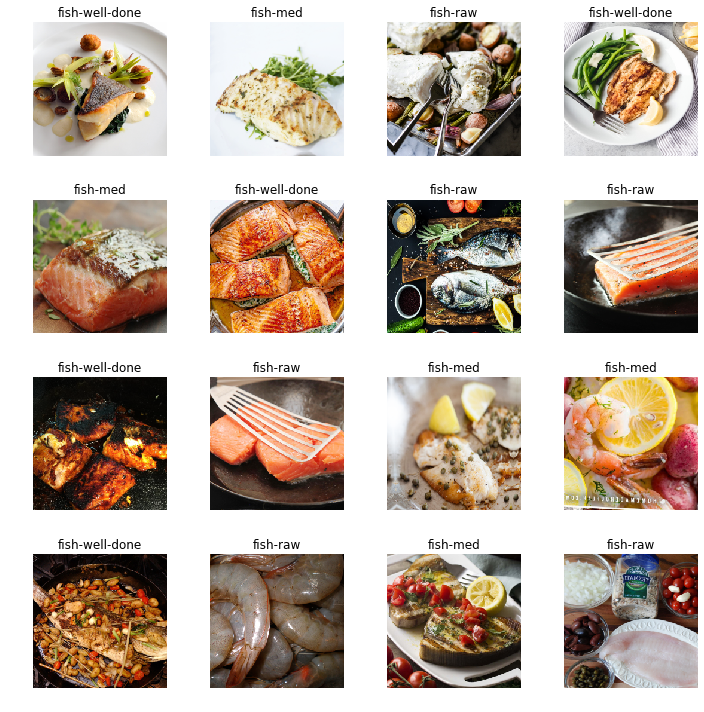

In [0]:
data.show_batch(rows=4, figsize=(10,10))

In [0]:
data.classes, data.c, len(data.train_ds), len(data.valid_ds)

(['fish-med', 'fish-raw', 'fish-well-done'], 3, 1088, 271)

## Train model

In [0]:
# init cnn
learn = cnn_learner(data, models.resnet34, metrics=error_rate, callback_fns=ShowGraph)

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/checkpoints/resnet34-333f7ec4.pth
100%|██████████| 87306240/87306240 [00:01<00:00, 83902820.92it/s]


epoch,train_loss,valid_loss,error_rate,time
0,1.093829,0.576325,0.225092,02:24
1,0.804770,0.489240,0.173432,02:23
2,0.641953,0.461764,0.162362,02:25
3,0.545059,0.449455,0.158672,02:24


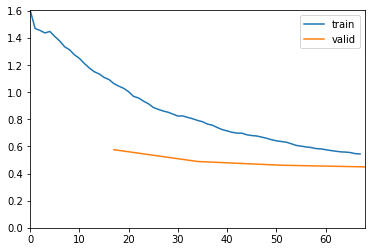

In [0]:
learn.fit_one_cycle(4)

In [0]:
learn.save('stage-1')

In [0]:
learn.unfreeze()
learn.lr_find()#start_lr=1e-6)

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


Loss decline is STEEPEST with `learning_rate` between 1e-04 and 1e-03 

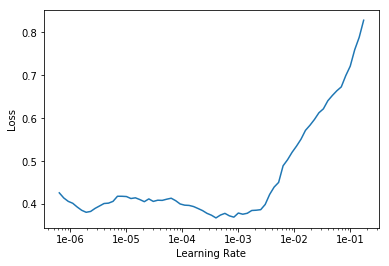

In [0]:
learn.recorder.plot(suggestion=False)

epoch,train_loss,valid_loss,error_rate,time
0,0.378303,0.568792,0.214022,02:26
1,0.295511,0.413425,0.143911,02:26
2,0.253212,0.359466,0.125461,02:25
3,0.202294,0.294516,0.095941,02:25


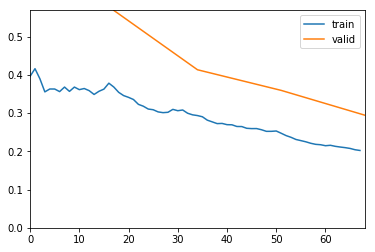

In [0]:
learn.load('stage-1')
learn.fit_one_cycle(4, max_lr=slice(1e-04,1e-03))

learn.save('stage-2')

## Interpretation

In [0]:
learn.load('stage-2')

interp = ClassificationInterpretation.from_learner(learn)

#### Model Predictions by Class
The learner has the most difficulty discerning `well-done` and `med` when predicting `med`.

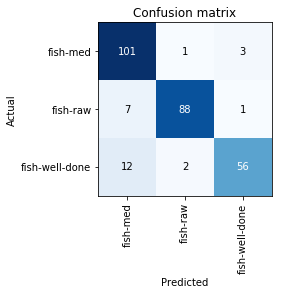

In [0]:
interp.plot_confusion_matrix()

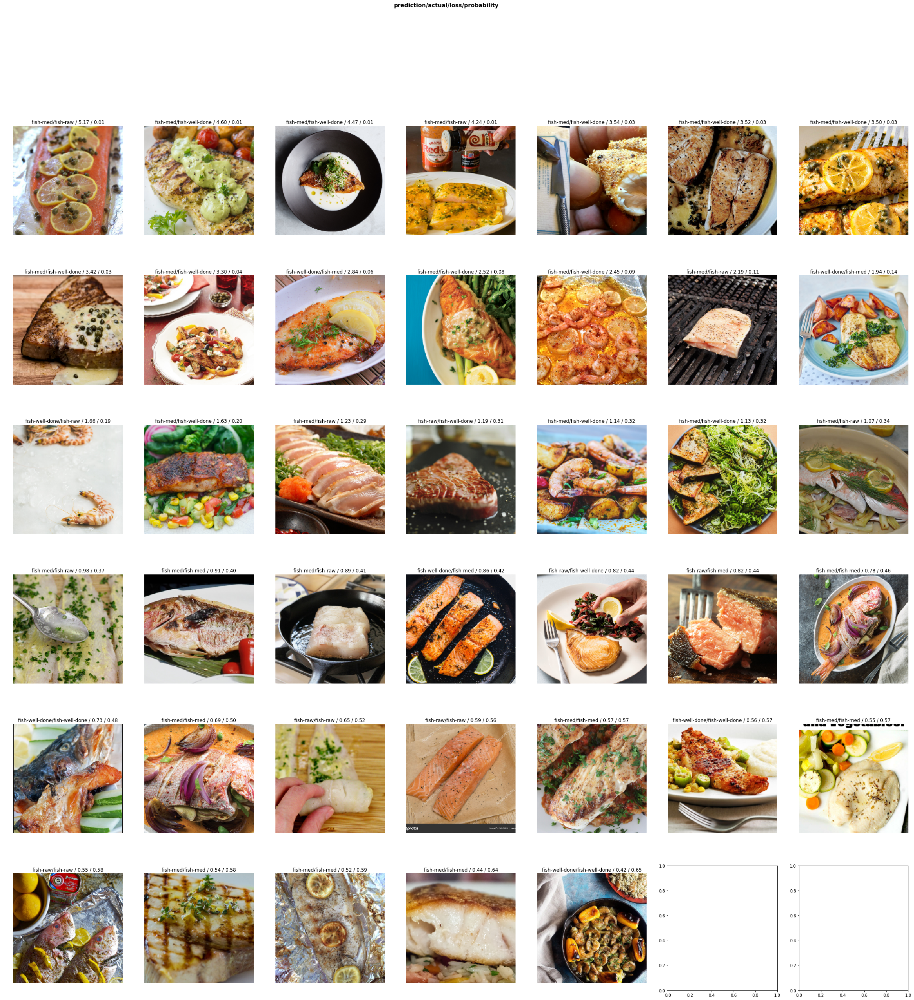

In [0]:
interp.plot_top_losses(40,figsize=(40,40))

In [0]:
interp.most_confused()

[('fish-well-done', 'fish-med', 12),
 ('fish-raw', 'fish-med', 7),
 ('fish-med', 'fish-well-done', 3),
 ('fish-well-done', 'fish-raw', 2),
 ('fish-med', 'fish-raw', 1),
 ('fish-raw', 'fish-well-done', 1)]

### Evaluate Predictions Class  

In [0]:
class Eval:
    def __init__(self,learner,img_data_bunch_val,class_list):
        
        self.learner = learner
        self.img_data_bunch_val = img_data_bunch_val # should pass data.valid_ds
        self.class_list = class_list # stores class labels
        self.predictions_df = None   # stores learner predict results 
    
        from collections import defaultdict
        self.class_preds = defaultdict(list) # to store probas for all classes
        
    def _predict_images(self):
        '''
        calls predict method to compute class prediction and probabilities 
        for each class for an image in DataImageBunch validation set and stores
        results in self.predictions_df
        
        returns    : None 
        '''
        pred_list = []
        actual_class_list = []
        class_list = []
        img_list = []
        # loop through all validation image files: 
        for i in range(len(self.img_data_bunch_val)):
            # get image from ImageDataBunch object
            img = self.img_data_bunch_val[i][0]
            # pred is tuple of 
            # class_pred, tensor(index), tensor([class predictions])
            pred = self.learner.predict(img)
            
            # store probas for all classes
            for ix,label in enumerate(self.class_list):
                self.class_preds[label] += [float(pred[2][ix])]
                
            actual_class = self.img_data_bunch_val[i][1]
            pred_class = pred[0]
            pred_ix = int(pred[1])
            pred_proba = float(pred[2][pred_ix])
            
            # store intermediate results
            pred_list.append(pred_proba)
            actual_class_list.append(actual_class)
            class_list.append(pred_class)
            img_list.append(img)
            
        results_dict = {'pred_proba':pred_list,
                        'pred_class':class_list,
                        'actual_class':actual_class_list,
                        'image':img_list}     

        self.predictions_df = pd.DataFrame(data=results_dict)
        
        # assign pred probas for each class
        for label in self.class_list:
            self.predictions_df['pred_'+label] = self.class_preds[label]
            
        
    def _show_preds(self,hard=True,k=10):
        '''
        display k top or bottom valdiation set predictions by prediction proba
        for rows in self.predicitons_df
        
        hard    : specify most difficult/easy prediction results to return, bool 
        k       : number of results to show, int
        returns : None
        '''
        if hard:
            df = self.predictions_df.sort_values('pred_proba').head(k) 
            df.reset_index(drop=True,inplace=True) 
        else:
            df = self.predictions_df.sort_values('pred_proba',ascending=False).head(k)
            df.reset_index(drop=True,inplace=True) 
            
        # display results
        for i in range(len(df)):
            result = df.iloc[i]
            print('\npredicted class: {}'.format(result['pred_class']))
            print('actual class: {}'.format(result['actual_class']))
            for label in self.class_list:
                print('predicted proba {}: {:.3f}'.format(label,result['pred_'+label]))
            display(result['image'])

            
# init Evaluation class
ev = Eval(learn,data.valid_ds,data.classes)

# compute and store predictions on validation set
ev._predict_images()


### Display Top 10 Most Difficult to Classify Images


predicted class: fish-med
actual class: fish-med
predicted proba fish-med: 0.404
predicted proba fish-raw: 0.343
predicted proba fish-well-done: 0.253


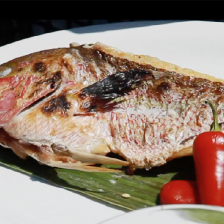


predicted class: fish-well-done
actual class: fish-raw
predicted proba fish-med: 0.360
predicted proba fish-raw: 0.189
predicted proba fish-well-done: 0.451


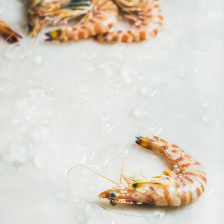


predicted class: fish-med
actual class: fish-med
predicted proba fish-med: 0.457
predicted proba fish-raw: 0.207
predicted proba fish-well-done: 0.336


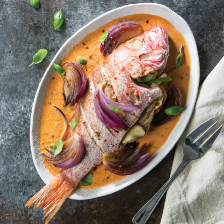


predicted class: fish-med
actual class: fish-raw
predicted proba fish-med: 0.464
predicted proba fish-raw: 0.413
predicted proba fish-well-done: 0.124


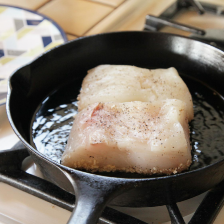


predicted class: fish-well-done
actual class: fish-well-done
predicted proba fish-med: 0.302
predicted proba fish-raw: 0.217
predicted proba fish-well-done: 0.481


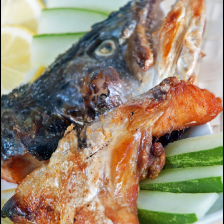


predicted class: fish-med
actual class: fish-med
predicted proba fish-med: 0.499
predicted proba fish-raw: 0.467
predicted proba fish-well-done: 0.034


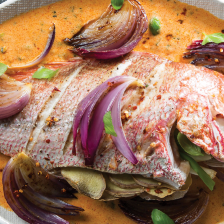


predicted class: fish-raw
actual class: fish-raw
predicted proba fish-med: 0.476
predicted proba fish-raw: 0.523
predicted proba fish-well-done: 0.002


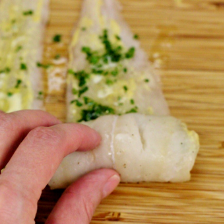


predicted class: fish-raw
actual class: fish-well-done
predicted proba fish-med: 0.032
predicted proba fish-raw: 0.529
predicted proba fish-well-done: 0.439


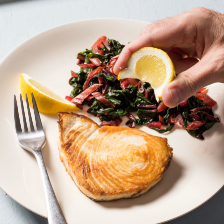


predicted class: fish-raw
actual class: fish-med
predicted proba fish-med: 0.439
predicted proba fish-raw: 0.534
predicted proba fish-well-done: 0.027


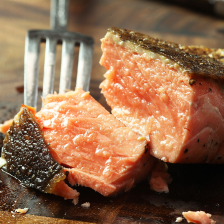


predicted class: fish-raw
actual class: fish-raw
predicted proba fish-med: 0.444
predicted proba fish-raw: 0.556
predicted proba fish-well-done: 0.000


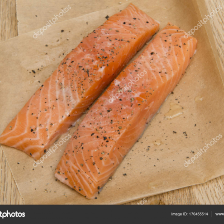

In [0]:
ev._show_preds(hard=True,k=10)

#### Display Top 10 Easiest to Classify Images


predicted class: fish-raw
actual class: fish-raw
predicted proba fish-med: 0.000
predicted proba fish-raw: 1.000
predicted proba fish-well-done: 0.000


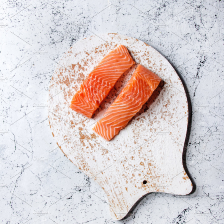


predicted class: fish-raw
actual class: fish-raw
predicted proba fish-med: 0.000
predicted proba fish-raw: 1.000
predicted proba fish-well-done: 0.000


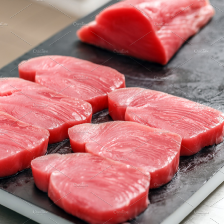


predicted class: fish-raw
actual class: fish-raw
predicted proba fish-med: 0.000
predicted proba fish-raw: 1.000
predicted proba fish-well-done: 0.000


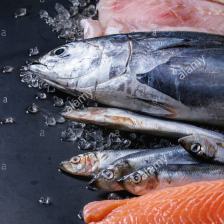


predicted class: fish-raw
actual class: fish-raw
predicted proba fish-med: 0.000
predicted proba fish-raw: 1.000
predicted proba fish-well-done: 0.000


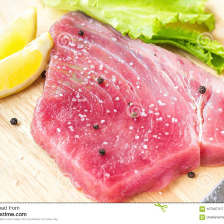


predicted class: fish-raw
actual class: fish-raw
predicted proba fish-med: 0.000
predicted proba fish-raw: 1.000
predicted proba fish-well-done: 0.000


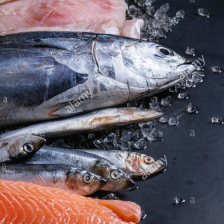


predicted class: fish-raw
actual class: fish-raw
predicted proba fish-med: 0.000
predicted proba fish-raw: 1.000
predicted proba fish-well-done: 0.000


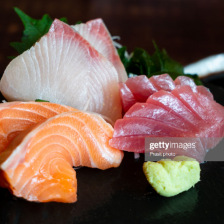


predicted class: fish-raw
actual class: fish-raw
predicted proba fish-med: 0.000
predicted proba fish-raw: 1.000
predicted proba fish-well-done: 0.000


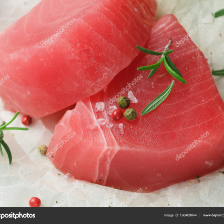


predicted class: fish-raw
actual class: fish-raw
predicted proba fish-med: 0.000
predicted proba fish-raw: 1.000
predicted proba fish-well-done: 0.000


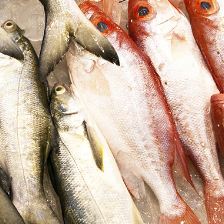


predicted class: fish-well-done
actual class: fish-well-done
predicted proba fish-med: 0.000
predicted proba fish-raw: 0.000
predicted proba fish-well-done: 1.000


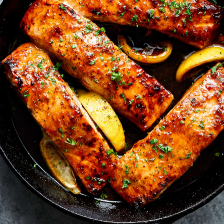


predicted class: fish-well-done
actual class: fish-well-done
predicted proba fish-med: 0.000
predicted proba fish-raw: 0.000
predicted proba fish-well-done: 1.000


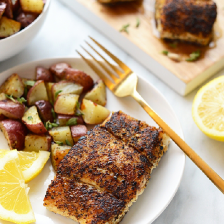

In [0]:
ev._show_preds(hard=False,k=10)

## EDA class

In [0]:
import os
from PIL import Image 

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

class EDA:
    def __init__(self,path):
        self.path = path
        self.dimension_dfs = {} 
        self.descriptive_df = pd.DataFrame()

        
    def _compute_image_dims(self,folder):
        '''
        compute dims for all items in os.walk folder
        folder    : class folder, str
        returns   : tuple of row dims, col dims lists
        '''
        root,dirs,files = next(os.walk(self.path+'/{}'.format(folder)))
        # populate row,col size counter dict
        row_size_list,col_size_list = [],[]
        for i in range(len(files)):
            img_pth = root+'/'+files[i] 
            img = Image.open(img_pth)
            dim = img.size
            row_size_list.append(dim[0])
            col_size_list.append(dim[1])
        return row_size_list, col_size_list
    
    

    def _compute_histograms(self,widths,heights,fig_sz=(10,6),
                            xlabel='xlabel',label='name'):
        fig,ax = plt.subplots(ncols=2,figsize=fig_sz)
        # row dim historgram
        sns.distplot(widths,ax=ax[0])
        ax[0].set(title='{} Pixel Width Distribution'.format(label),
               xlabel=xlabel)
        # col dim histogram
        sns.distplot(heights,ax=ax[1])
        ax[1].set(title='{} Pixel Height Distribution'.format(label),
               xlabel=xlabel)

        
    def _store_class_data(self,folder_list):
        '''
        append data to self.dimensions_df dict for lists in folder_list
        folder_list  : folder names to append, list of str
        returns      : None
        '''
        for fname in folder_list:
            row_list,col_list = self._compute_image_dims(fname)
            self.dimension_dfs[fname] = row_list,col_list

            
    def _descriptive_stats(self,size_list,folder):
        '''
        compute descriptive stats on data in list
        size_list    : dimension data to compute stats, list of int
        folder       : name of class label, str
        returns      : None
        '''
        arr = np.array(size_list)
        n = len(size_list)
        mn,med,ave,mx = np.min(arr),np.median(arr),np.mean(arr),np.max(arr)
        std = np.std(arr)
        df = pd.DataFrame(index=['count','min','median','mean','max','std'],
                          columns=[folder],
                          data=[n,mn,med,ave,mx,std])
        self.descriptive_df = pd.concat([self.descriptive_df,df],axis=1)

data_path = base_dir+'data/food'

# init eda object
e = EDA(data_path)

# specify names of class folders 
classes = ['fish-raw','fish-med','fish-well-done']

# compute pixel dimensions for each file for each label in classes list
# and append list of width, list of height tuple to eda object dimension_dfs dict
e._store_class_data(classes)

,fish-raw_widths,fish-raw_heights,fish-med_widths,fish-med_heights,fish-well-done_widths,fish-well-done_heights
count,509.000000,509.000000,523.000000,523.000000,319.000000,319.000000
min,334.000000,317.000000,367.000000,320.000000,500.000000,324.000000
median,1200.000000,1000.000000,1200.000000,1066.000000,1200.000000,1200.000000
mean,1492.261297,1223.893910,1526.282983,1489.537285,1671.639498,1524.529781
max,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
std,1054.430341,813.183216,1135.469708,1018.232773,1185.837478,1017.704023


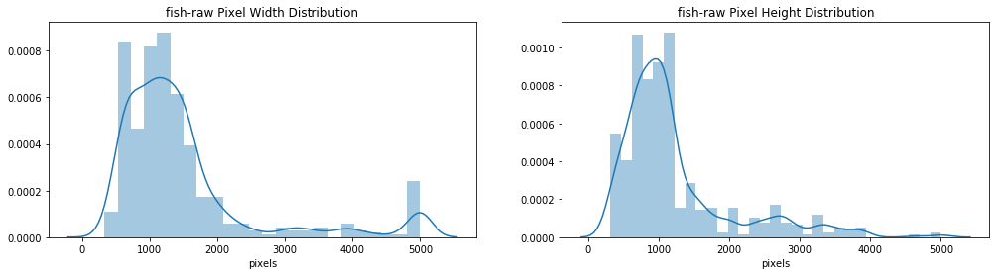

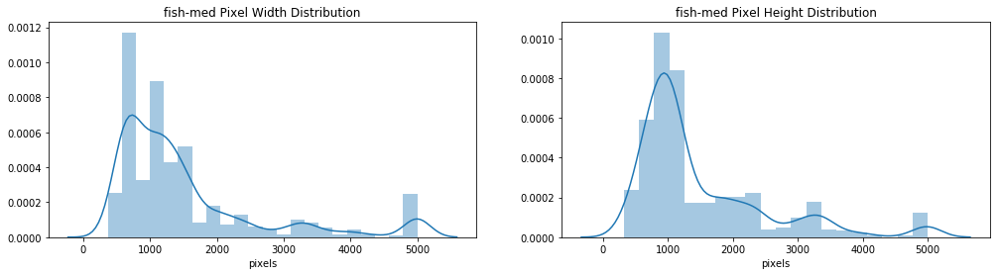

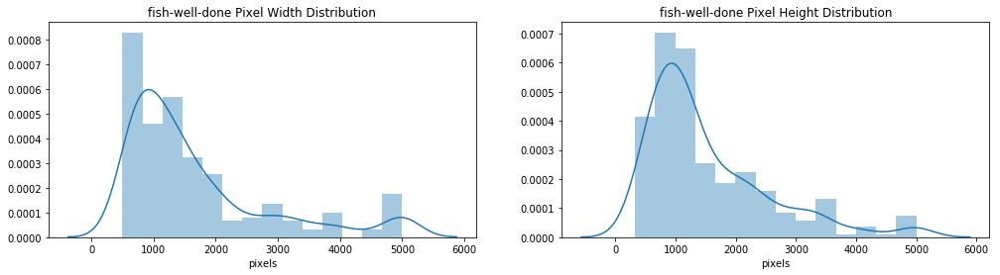

In [0]:
for label in classes:
    widths,heights = e.dimension_dfs[label]
    # compute width descriptive stat dataframe for folder label in classes list 
    des_widths = e._descriptive_stats(widths,label+'_widths')
    # compute height descriptive stat dataframe for folder label in classes list 
    des_heights = e._descriptive_stats(heights,label+'_heights')
    # display historgram for label in classes
    e._compute_histograms(widths,heights,fig_sz=(17,4),xlabel='pixels',label=label)
    
e.descriptive_df

### Duplicated Image file Remover 
- class by Rahul Zalkikar

In [0]:
#!/usr/bin/env python
# coding: utf-8

# In[6]:


import os
!pip install dhash
import dhash
import collections
from PIL import Image

class dhasher:
    
    def __init__(self, directories):
        self.directories = directories
        file_dirs, unq_files = self.filer()
        dhash_mtrx = self.difhashmtrx(file_dirs,unq_files)
        self.detectduplicates(dhash_mtrx,file_dirs)
        
    def filer(self):
        file_dirs = [[] for x in range(len(self.directories))]
        unq_files = [[] for x in range(len(self.directories))]
        counter = 0
        total_files = 0
        for d in self.directories:
            os.chdir(d)
            path = os.getcwd()
            for filename in os.listdir(path):
                filepath = os.path.join(path, filename)
                file_dirs[counter].append(filepath)
                unq_files[counter].append(filename[filename.find('.')+1:len(filename)-4]) 
            print(len(unq_files[counter]),"total images in",path)
            total_files += len(unq_files[counter])
            counter += 1
        print('\n',total_files,"total images in all classes.")
        return file_dirs, unq_files
    
    def difhashmtrx(self, file_dirs,unq_files):
        print("\nForming Dhash (Size = 8) Matrix...")
        dif_hash_mtrx = [[] for x in range(len(self.directories))]
        c1 = 0
        unhashed = []
        for clas in file_dirs:
            for image_path in clas:
                try:
                    image = Image.open(image_path).convert("RGBA") # All palette images with transparency expressed in bytes should converted to RGBA images 
                    row, col = dhash.dhash_row_col(image)
                    image_hash = dhash.format_hex(row, col)
                    dif_hash_mtrx[c1].append(image_hash)
                except:
                    unhashed.append(image_path)
                    print(image_path," - file type is unhashable.")
            c1 += 1
        print(len(unhashed)," images ignored.")
        return dif_hash_mtrx
            
    def detectduplicates(self, dif_hash_mtrx,file_dirs):
        # Find common elements within sublists of the dhash matrix
        duplicate_indx_mtrx = []
        unq_elems_mtrx = []
        across_file_duplicates = []
        c1 = 0
        print("\nDhashing...")
        for z in dif_hash_mtrx:
            duplicate_indx = [i for i in range(len(z)) if not i == z.index(z[i])]
            unq_elems = [z[i] for i in range(len(z)) if i == z.index(z[i])]
            unq_elems_mtrx.append(unq_elems)
            duplicate_indx_mtrx.append(duplicate_indx)
            print(len(z)-len(unq_elems),"duplicate images within",self.directories[c1],"found.")
            c1 += 1

        # Find common elements across sublists of the dhash matrix - this should be 0 (or very close to it)
        unq_elems_mtrx_list = [item for sublist in unq_elems_mtrx for item in sublist]
        if len(unq_elems_mtrx_list) - len(set(unq_elems_mtrx_list)) == 0:
            print("No duplicate images across classes.")
        else: 
            print(len(unq_elems_mtrx_list) - len(set(unq_elems_mtrx_list)),"duplicate images across classes found.")
            unq_a = [item for item, count in collections.Counter(unq_elems_mtrx_list).items() if count > 1]
            print("\nDuplicates in 2 or more classes:")
            for a in unq_a:
                for i in range(len(file_dirs)):
                    try:
                        file_path = file_dirs[i][dif_hash_mtrx[i].index(a)]
                        across_file_duplicates.append(file_path)
                        print('\n',file_path)
                    except:
                        continue
                        #print("Image not in",self.directories[i])
        return across_file_duplicates

raw_dir = root_dir + 'fellowshipai-data/jeffrey/data/food/fish-raw/'
med_dir = root_dir + 'fellowshipai-data/jeffrey/data/food/fish-med/'
well_dir = root_dir + 'fellowshipai-data/jeffrey/data/food/fish-well-done/'
dir_list = [raw_dir,med_dir,well_dir]

dhasher(dir_list)    

  Created wheel for dhash: filename=dhash-1.3-cp36-none-any.whl size=7274 sha256=a2314488f18b098e4015820a9a29abd672ec5520d1c18523c3fac155a3ba69ee
  Stored in directory: /root/.cache/pip/wheels/a4/cb/88/d7cf61a1ac52042d59cc0c7a130c04b1541dfd439570c6ea41
Successfully built dhash
509 total images in /content/gdrive/My Drive/fellowshipai-data/jeffrey/data/food/fish-raw
523 total images in /content/gdrive/My Drive/fellowshipai-data/jeffrey/data/food/fish-med
330 total images in /content/gdrive/My Drive/fellowshipai-data/jeffrey/data/food/fish-well-done

 1362 total images in all classes.

Forming Dhash (Size = 8) Matrix...
0  images ignored.

Dhashing...
27 duplicate images within /content/gdrive/My Drive/fellowshipai-data/jeffrey/data/food/fish-raw/ found.
90 duplicate images within /content/gdrive/My Drive/fellowshipai-data/jeffrey/data/food/fish-med/ found.
41 duplicate images within /content/gdrive/My Drive/fellowshipai-data/jeffrey/data/food/fish-well-done/ found.
3 duplicate images ac